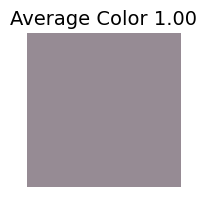

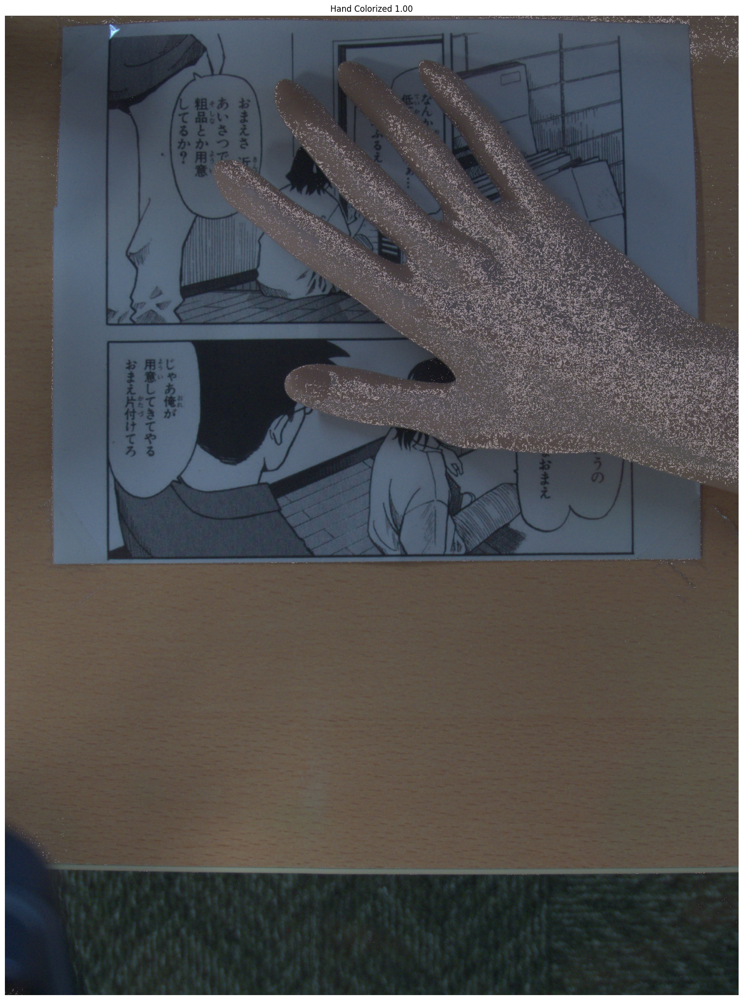

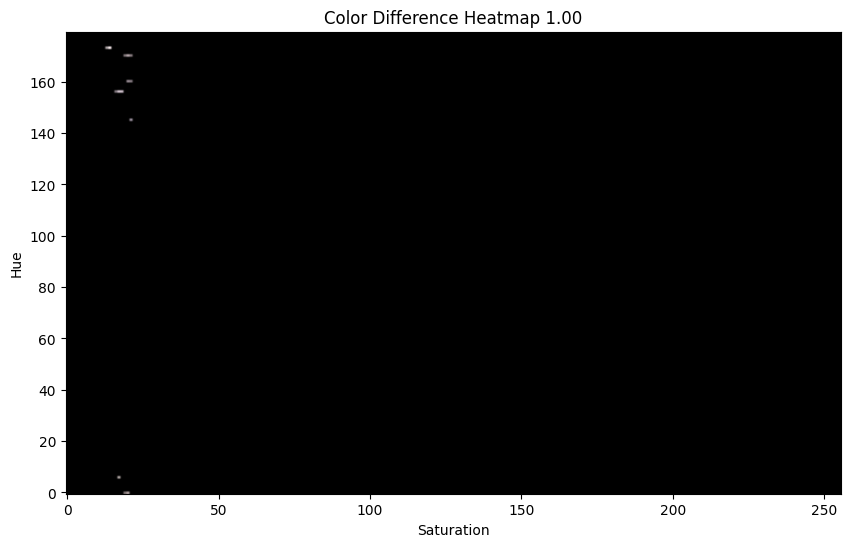

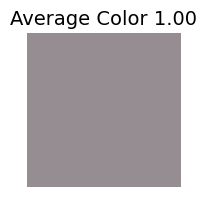

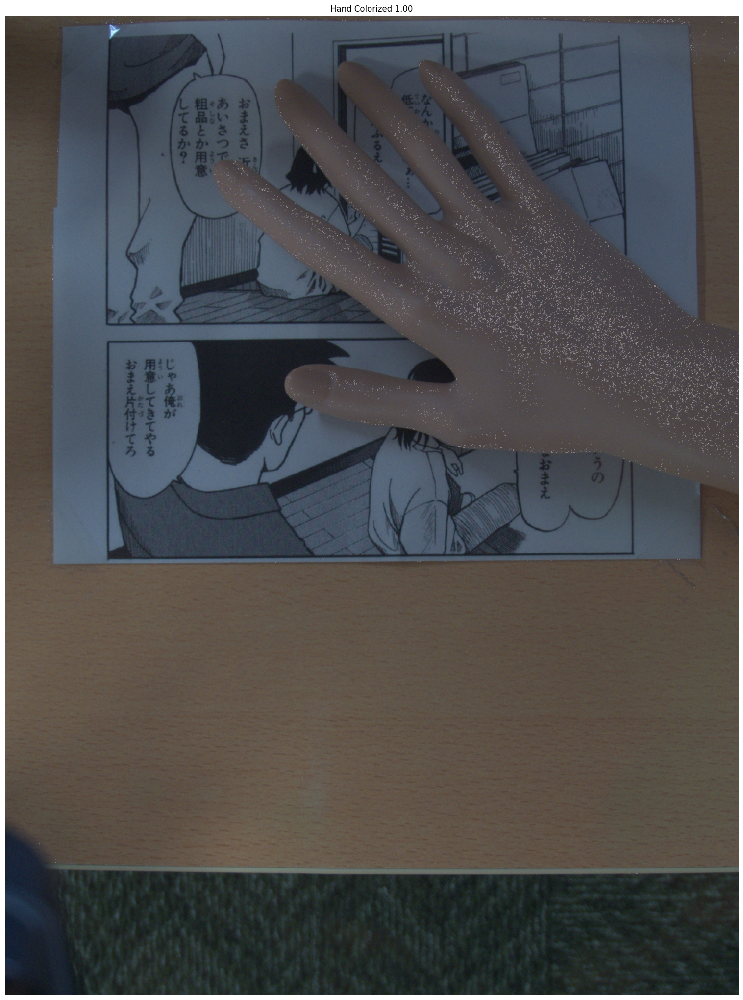

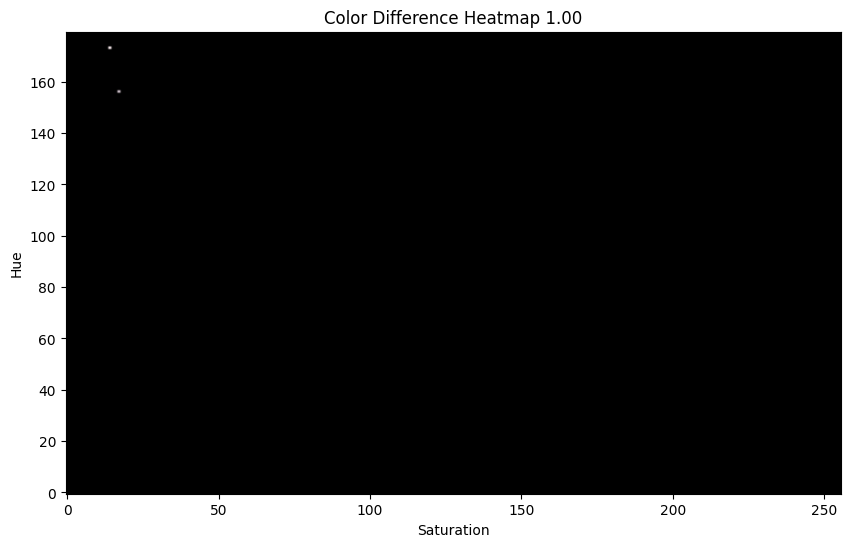

In [1]:
from typing import Dict
import cv2
import numpy as np
import matplotlib.pyplot as plt
from typing import Dict, List, Tuple
import os
import sys
from scipy.stats import circmean

sys.path.append(os.path.abspath(".."))
from matlike_utils import downscale
from prototyping.plotting import *


def bgr_to_hsv_array(array: np.ndarray) -> np.ndarray:
    """ Converts bgr to hsv color space """
    return cv2.cvtColor(array, cv2.COLOR_BGR2HSV)

def bgr_to_hsv_color(color: tuple[int, int, int]) -> tuple[int, int, int]:
    """ Converts bgr to hsv color space """
    # Create a 1x1 image with the BGR color
    bgr_array = np.array([[color]], dtype=np.uint8)
    hsv_array = cv2.cvtColor(bgr_array, cv2.COLOR_BGR2HSV)
    hsv = hsv_array[0, 0]
    
    return tuple(int(x) for x in hsv)

def hsv_to_rgb_color(color: tuple[int, int, int]) -> tuple[int, int, int]:
    hsv_array = np.array([[color]], dtype=np.uint8)
    bgr_array = cv2.cvtColor(hsv_array, cv2.COLOR_HSV2RGB)
    bgr = bgr_array[0, 0]
    return tuple(int(x) for x in bgr)

def get_histogram(image):
    # Channel 0 = Hue, 1 = Saturation, 2 = Value
    histogram = cv2.calcHist([image], [0, 1], None, [180, 256], [0, 180, 0, 256])
    return histogram.flatten()
    # return cv2.normalize(histogram, histogram).flatten()


def get_color_occurrence_dict(delta_histogram_2d: np.ndarray) -> Dict[Tuple[int, int], int]:
    """
    Returns a dictionary mapping each (Hue, Saturation) pair to its occurrence count.

    Parameters:
    - delta_histogram_2d: np.ndarray (2D array with shape (180, 256) for Hue and Saturation bins)

    Returns:
    - Dict[Tuple[int, int], int]: A dictionary where keys are (Hue, Saturation) pairs and values are their frequencies.
    """
    hue_bins = np.arange(180)  # Hue values (0-179)
    sat_bins = np.arange(256)  # Saturation values (0-255)
    hue_grid, sat_grid = np.meshgrid(hue_bins, sat_bins, indexing="ij")  # Create grid for Hue and Saturation

    # Flatten the 2D grids and the histogram
    hue_flat = hue_grid.flatten()
    sat_flat = sat_grid.flatten()
    delta_flat = delta_histogram_2d.flatten()

    # Filter out zero values (ignoring empty bins)
    mask = delta_flat > 0
    hue_filtered = hue_flat[mask]
    sat_filtered = sat_flat[mask]
    counts = delta_flat[mask]

    # Map (Hue, Saturation) pairs to their frequencies and sort by frequency
    color_occurrence = {(int(h), int(s)): int(c) for h, s, c in zip(hue_filtered, sat_filtered, counts)}
    sorted_occurrence = dict(sorted(color_occurrence.items(), key=lambda item: item[1], reverse=True))
    
    return sorted_occurrence

def colorize_hsv_image(
        image: np.ndarray, 
        target_colors: List[Tuple[int, int]], 
        new_value: int, 
        hue_tolerance: int = 0,
        sat_tolerance: int = 0,) -> np.ndarray:
    """
    Changes values of the colors specified by hue and saturation with the given value.
    """
    # Create a copy of the image to modify
    result_image = image.copy()
    
    for hue, sat in target_colors:
        # Define ranges for hue with tolerance and exact match for saturation
        lower_bound = np.array([max(0, hue - hue_tolerance), sat - sat_tolerance, 0], dtype=np.uint8)
        upper_bound = np.array([min(179, hue + hue_tolerance), sat + sat_tolerance, 255], dtype=np.uint8)
        
        # Create a mask for pixels within the range
        mask = cv2.inRange(result_image, lower_bound, upper_bound)
        
        # Apply the new color to areas matching the mask
        result_image[mask > 0] = (hue, sat, new_value)
    
    return result_image

def average_hue_sat_colors(colors: list[tuple[float, float]]) -> tuple[float, float]:
    hues = np.array([color[0] for color in colors], dtype=np.float32)  # Hue in degrees
    sats = np.array([color[1] for color in colors], dtype=np.float32)  # Saturation (0-1)
    return circmean(hues, high=360, low=0), np.mean(sats)


background = cv2.imread('images/background_image.jpg')
image = cv2.imread('images/hand_image.jpg')

# Convert to HSV color space
background_hsv = downscale(bgr_to_hsv_array(background), 1)
hand_hsv = downscale(bgr_to_hsv_array(image), 1)

# Compute histograms and the delta histogram
histogram_background = get_histogram(background_hsv)
histogram_hand = get_histogram(hand_hsv)
delta_histogram_total = histogram_hand - histogram_background
# Only keep positive changes
delta_histogram = delta_histogram_total.copy()
delta_histogram[delta_histogram < 0] = 0 

# Plot histograms
# plot_histogram(histogram_background, "Background")
# plot_histogram(histogram_hand, "Hand")
# plot_histogram(delta_histogram_total, "Delta (positive + negative)")
# plot_histogram(delta_histogram, "Delta")

# Get non-zero histogram for percentile calculation
non_zero_values = delta_histogram[delta_histogram > 0] 
non_zero_portion = non_zero_values.size / delta_histogram.size
zero_portion = 1 - non_zero_portion

min_occurence = 10
tolerance = 5
plotting_value = 150

# for value in [0, 0.9, 0.99]:
for value in [0.99, 0.999]:
# for value in [0.99]:
    portion = zero_portion + value * non_zero_portion
    percentile_threshold = np.percentile(non_zero_values, 100 * portion)

    # Filer colors that dont occure often enoughly
    thresholded_delta_histogram = np.where(delta_histogram > percentile_threshold, delta_histogram, 0)

    # Reshape the thresholded delta histogram to its 2D form (180 bins for Hue, 256 bins for Saturation) and normalize it
    delta_histogram2d = thresholded_delta_histogram.reshape(180, 256)
    delta_histogram2d = (delta_histogram2d / np.max(delta_histogram2d) * 255).astype(np.uint8)

    occurence_by_color = get_color_occurrence_dict(delta_histogram2d)
    colors = [color for color, occurence in occurence_by_color.items() if occurence > min_occurence]
    average_hue, average_sat = average_hue_sat_colors(colors)
    plot_color(hsv_to_rgb_color((average_hue, average_sat, plotting_value)), f"Average Color {portion:.2f}")

    # Display the image with all colors recolorized
    colorized_image = colorize_hsv_image(hand_hsv, colors, plotting_value, tolerance)
    plot_hsv_image(colorized_image, f"Hand Colorized {portion:.2f}")

    # Create an HSV image for the heatmap
    hsv_image = cv2.merge(
        (
            np.repeat(np.arange(180)[:, np.newaxis], 256, axis=1).astype(np.uint8),  # Hue
            np.repeat(np.arange(256)[np.newaxis, :], 180, axis=0).astype(np.uint8),  # Saturation
            delta_histogram2d,  # Value
        )
    )
    # Plot the RGB heatmap
    plt.figure(figsize=(10, 6))
    plt.imshow(cv2.cvtColor(hsv_image, cv2.COLOR_HSV2RGB), aspect='auto', origin='lower')
    plt.xlabel("Saturation")
    plt.ylabel("Hue")
    plt.title(f"Color Difference Heatmap {portion:.2f}")
    plt.show()
